<div class="pull-right"> 
<img src= https://upload.wikimedia.org/wikipedia/commons/f/f7/Hochschule_Mannheim_logo.svg "width=350" >
&emsp;
&emsp;
&emsp;
</div>

# Schwingungen und komplexe Zahlen

## Schwingungen gleicher Frequenz überlagern 


Reale Schwingungen haben mit komplexen Zahlen auf dem erstem Blick nichts gemeinsames. Nichtsdestotrotz vereinfachen komplexe Zahlen manche Berechnungen und ermöglichen einfache Interpretation und graphische Darstellung der Schwingungen.

In diesem Notebook zeigen wir Ihnen, wie man Schwingungen mit komplexen Zahlen darstellen kann.  
Hier haben wir keine besonderen Aufgaben für Sie vorgesehen. Wir ermutigen Sie, mit den Daten zu spielen und Änderungen zu beobachten, wenn diverse Parameter variiert werden. 

<div class="pull-right"> 
<img src="../Bilder/Summe_z_Vektoren.jpg" width="700">
</div>  

<br>
<br>
<br>


<div class="alert alert-block alert-info"> 
Komplexe Zahlen, die Schwingungen repräsentieren ($z_1, z_2, ...$ und ihre Summe $z_{sum}$), kann man in der Gaußschen Ebene als rotierende Vektoren darstellen.
</div>   

<div class="alert alert-block alert-info"><b></b>     
Die eigentliche Schwingung (der Realteil) wird als zeitabhägige Projektion auf die reelle Achse dargestellt. <i>Damit das Bild komplett wird, projizieren wir auch den Imaginärteil auf die imaginäre Achse.</i>
</div>

<div class="alert alert-block alert-info"> 
Aus einer Kombination von $\sin(\omega t)$ und $\cos (\omega t)$ kann man eine beliebige Schwingung mit der Kreisfrequenz $\omega$  erzeugen. 
    
$\sin(\omega t)$ und $\cos (\omega t)$ sind sozusagen wie $x$ und $y$ Vektoren im Kartesischen Koordinatensystem, aus denen Kombination man einen beliebigen Vektor in der $xy$-Ebene erstellen kann. 
    
Am einfachsten sieht man die Parallele in der Gaußschen Ebene. 
</div>    

Um Animatonen zu zeigen, brauchen wir `%matplotlib notebook`.

Allerdings  `%matplotlib notebook` läuft unter Binder und JupyterLab nicht!!!

Um Animationen dort zu zeigen, brauchen wir ein Modul Names `ipympl`, was man erst einmalig mit `!pip install ipympl` installiern muss.

Dann brauchen wir noch am Anfang (im Binder und JupyterLab)

`from IPython.display import HTML` 

`%matplotlib widget`

und zum Schluss, um die `anim`-Animation zu zeigen:

`display(HTML(anim.to_jshtml(default_mode='loop')))`


In [1]:
%matplotlib widget
from IPython.display import HTML

import matplotlib.pyplot as plt 
from matplotlib import animation  # für Animationen  


# numpy importieren
import numpy as np

# sympy importieren
import sympy as sy

### Überlagerung zweier Schwingungen gleicher Frequenz und Richtung   (wie in [wikibooks](https://de.wikibooks.org/wiki/Komplexe_Zahlen/_Anwendung_in_der_klassischen_Physik))

Die beiden Schwingungen lauten: 

\begin{aligned}
x_1\;&=\;a_1\,\cos(\omega t+\varphi_1)\\
x_2\;&=\;a_2\,\cos(\omega t+\varphi_2)
\end{aligned}

Die Summe $x = x_1 + x_2$ wird wir nicht mithilfe von Additionstheoremen berechnet, sondern mit komplexen Zahlen. 

Die Schwingungen $x_1$ und $x_2$ sind Realteile der komplexen Formen 

\begin{array}{cclcl}
    x_1&\to & z_1\;=\;a_1\mathrm {e} ^{\mathrm {i} \,(\omega t +\varphi_1)}\\
    x_2&\to & z_2\;=\;a_2\mathrm {e} ^{\mathrm {i} \,(\omega t +\varphi_2)}  
\end{array}

Die resultierende Schwingung lautet:

\begin{aligned}
z\;=\;z_1+z_2\;=\;(a_1\,\mathrm {e} ^{\mathrm {i} \,\varphi_1}+a_2\,\mathrm {e} ^{\mathrm {i} \,\varphi_2})\cdot \mathrm {e} ^{\mathrm {i} \,\omega t}\;:=\;z_0\,\cdot \mathrm {e} ^{\mathrm {i} \,\omega t}\;=\;|z_0|\,\cdot \mathrm {e} ^{\mathrm {i} \,(\omega t + \varphi_0)}\;
\end{aligned}

wo $z_0$ eine komplexe Amplitude ist, ${\displaystyle z_0\;=\;|z_{0}| \cdot \mathrm {e} ^{\mathrm {i} \,\varphi_0} }$. 


$z_0$ ausgeschrieben aus der Polarform <font size="1"> ($e^{i\,\varphi}=\cos\varphi + i \sin\varphi $) </font> : 

\begin{aligned}
z_0\;=\;(a_1\cos\varphi_1 + a_2\cos\varphi_2) + \mathrm {i} \,(a_1\sin\varphi_1 + a_2\sin\varphi_2)\;:=\;C+\mathrm {i} \,S 
\end{aligned}

Hierin bedeuten (C für cos-Terme, S für sin-Terme):

\begin{aligned}
C\;=\; a_1\cos\varphi_1 + a_2\cos\varphi_2 \\
S\;=\; a_1\sin\varphi_1 + a_2\sin\varphi_2
\end{aligned}

Die Amplitude der resultierenden Schwingung lautet:

${\displaystyle |z_{0}|\;=\;\sqrt{C^2+S^2} }$

Die Phase ergibt sich aus ${\displaystyle \;\tan {\varphi_0}={\tfrac{S}{C}}\!}$.

Uns interessiert der Realteil der resultierenden Schwingung, da $x=x_1+x_2=Re(z_1)+Re(z_2)=Re(z)$, i.e. ${\displaystyle \;x=|z_{0}|\cos(\omega t+\varphi_0)}$. 

$x$  hat dieselbe Richtung und dieselbe Frequenz, wie die Ausgangsschwingungen. 

Hier ein Beispiel, wie man mit `sympy` solche Überlagerung der Schwingungen darstellen kann.

In [2]:
# Amplituden und Phasen der beiden Schwingungen
a1=10                       # Amplitude der ersten Schwingung
phi1=0                      # Phase der ersten Schwingung
a2=10                       # Amplitude der zweiten Schwingung
phi2= sy.pi/2               # Phase der zweiten Schwingung

# Symbole für komplexe Schwingungen definieren: Amplitude a, Phase phi, Kreisfrequenz w, Zeit t
a, phi, w, t=sy.symbols('a phi \omega t', real=True) # es sollen reelle Zahlen sein, daher die Option real=True 

# Allgemein: Schwingung in komplexer Exponentialform 
z_sy=a*sy.exp(sy.I*(w*t+phi))     

z1=z_sy.subs(({a: a1, phi: phi1})).evalf()# erste Schwingung: a wird durch a1 ersetzt, und phi durch phi1
z2=z_sy.subs(({a: a2, phi: phi2})).evalf()# zweite Schwingung: a->a2, phi->phi2  

sy.simplify(z1+z2)    # Komplexe Summe der Schwingungen 


10.0*(1 + I)*exp(I*\omega*t)

In [3]:
sy.simplify(sy.re(z1+z2))    # Realteil der Summe der Schwingungen 

10.0*sqrt(2)*cos(\omega*t + pi/4)

### Graphische Darstellung der Schwingungen

Graphisch kann man komplexe Zahlen, die Schwingungen repräsentieren (z1, z2, ... und ihre Summe), in der Gaußschen Ebene als rotierende Vektoren darstellen, da ihr Argument eine lineare Funktion der Zeit ist. Die Überlagerung zweier Schwingungen wird als vektorielle Summe der Summanden dargestellt.
   
Der Realteil der Schwingungen (die eigentliche Schwingung) wird als zeitabhägige Projektion auf der reellen Achse dargestellt. Damit das Bild komplett wird, projizieren wir auch den imaginären Teil auf die imaginäre Achse.
     

Um nicht jedes mal die Grafik neu schreiben zu müssen, haben wir einmal unsere Grafik-Funktion `male_Schwingungen_z_und_y_von_t` definiert. Dieser Funktion übergeben wir als Argumente unsere komplexen Zahlen, Zeit-Skala und den Titel des Graphen. Diese erzeugen wir mit der Funktion `erzeuge_z_Vektoren_und_Summe` aus gegebenen Kreisfrequenzen, Amplituden und Phasen, gegebener Zeitskala. 
Unsere Grafik-Funktion gibt wiederum Werte zurück, die man als input-Argumente in der `matplotlib animation`-Bibliothek eingebauten `FuncAnimation`-Funktion verwenden kann.  

Um unsere Funktionen, die in einem anderen Notebook definiert sind, zu benutzen, müssen wir dieses Notebook mit dem `%run` Befehl ausführen:    

In [4]:
%run Functions4animatedKomplexOscillations.ipynb

Sie dürfen die hier stehenden Werte variieren, um Änderungen in der Grafiken zu beobachten:

In [5]:
# konkrete Zahlen, um Schwingungen zu plotten. Damit wir beliebig viele Schwingungen addieren können, 
# schreiben wir ihre Parameter (Amplitude usw.) als python-Listen in Klammern [] 
omega=[2*2*sy.pi,2*2*sy.pi]      # Kreisfrequenz, gleich für alle Schwingungen
amp  = [10, 5]                   # Amplitude der ersten, zweiten, etc. Schwingung
phase= [0, sy.pi/2]              # Phase der ersten, zweiten, etc. Schwingung
T=np.linspace(0,2,100)           # Zeitbereich T zum Zeichnen definieren
Titel='2 z-Vektoren und ihre Summe in Gauß-Ebene'   

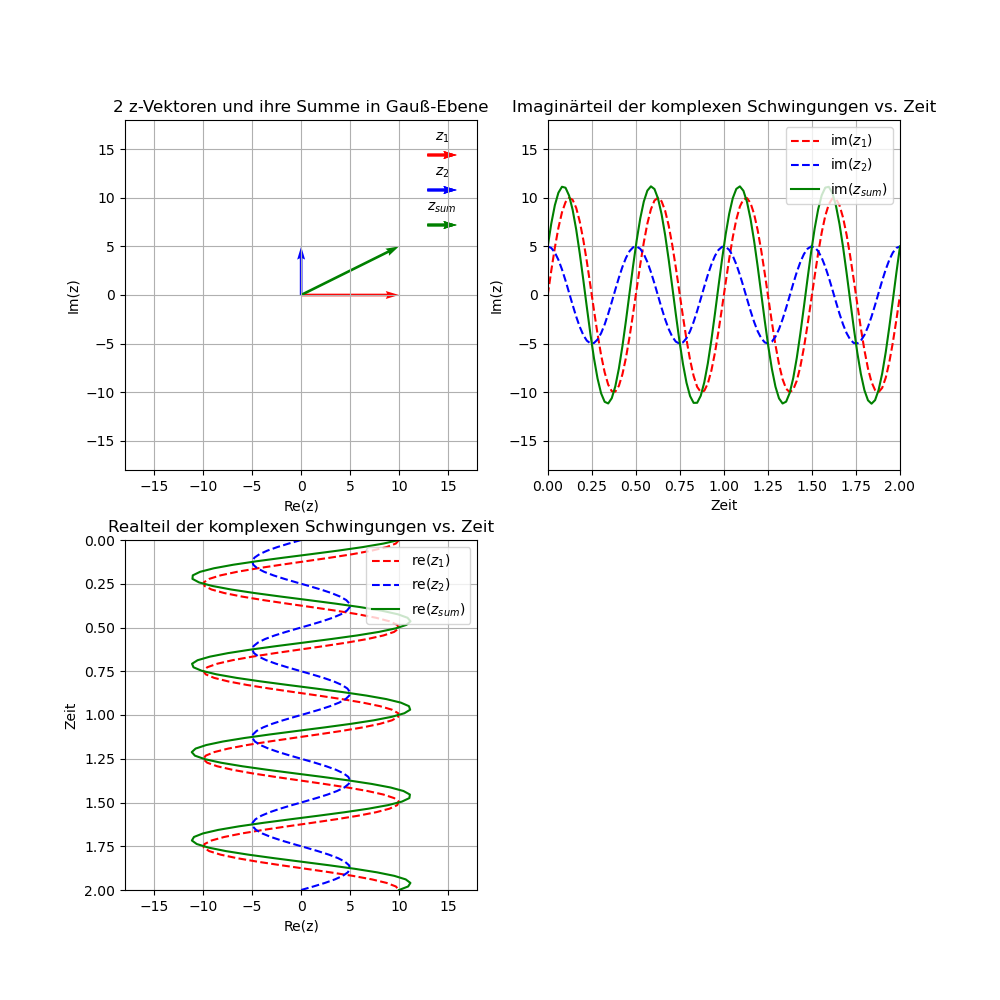

In [6]:
# unsere Funktionen aus dem Functions4animatedKomplexOscillations.ipynb-Notebook anwenden:
z_all=erzeuge_z_Vektoren_und_Summe(omega, amp, phase, T)
Q, X, Y, fig01, line1, line2, x, y, zeit = male_Schwingungen_z_und_y_von_t(z_all,T,Titel)
Intervall=80 # in [ms]: wie schnell soll die Grafik aktualisiert werden

anim = animation.FuncAnimation(fig01, update_quiver_and_line, fargs=(Q, X, Y, z_all, zeit, 
                                                                      x, y, line1, line2, T),
                               interval=Intervall, blit=True)

# damit es auch unter Binder und JupyterLab läuft:
# Achtung! Es dauert ziemlich lang, bis das Programm startet!

display(HTML(anim.to_jshtml(default_mode='loop'))) 